## Import Library

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import skimage.io as io
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Input
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Model

## Uplode Your Kaggle.Json

In [ ]:
# Mengunggah file kaggle.json yang berisi API key dari akun Kaggle
print('Upload Kaggle.json')

from google.colab import files
uploaded = files.upload()

# Membuat folder .kaggle jika belum ada untuk menyimpan kaggle.json
os.makedirs("/root/.kaggle", exist_ok=True)

# Memindahkan file kaggle.json ke direktori .kaggle agar bisa digunakan oleh Kaggle API
os.rename("kaggle.json", "/root/.kaggle/kaggle.json")

# Memberikan permission yang benar untuk file kaggle.json
!chmod 600 /root/.kaggle/kaggle.json


Upload Kaggle.json


Saving kaggle.json to kaggle.json


## Download Dataset


In [ ]:
# Mendownload dataset dari Kaggle
!kaggle datasets download -d imanuelsteven/animal-peek-indonesia

# Mengekstrak file ZIP ke folder yang sesuai
import zipfile

with zipfile.ZipFile("/content/animal-peek-indonesia.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/dataset")  # Ekstrak ke dalam folder /content/dataset


Dataset URL: https://www.kaggle.com/datasets/imanuelsteven/animal-peek-indonesia
License(s): CC-BY-NC-SA-4.0
100% 1.55G/1.55G [00:06<00:00, 202MB/s]
100% 1.55G/1.55G [00:06<00:00, 261MB/s]


## Preprocessing Image


In [ ]:
# Fungsi untuk preprocessing gambar
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224, 224))  # Mengubah ukuran gambar menjadi 224x224
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Mengubah dari BGR ke RGB
    image = image / 255.0  # Normalisasi gambar ke rentang [0, 1]
    return image

data_path = '/content/dataset/Animal Peek/animals'

# Mendapatkan nama-nama kelas dari direktori
animal_names = sorted(os.listdir(data_path))

# Proses gambar dan label
data = []
label = []

for animal in animal_names:
    animal_path = os.path.join(data_path, animal)

    if os.path.isdir(animal_path):
        for image_name in sorted(os.listdir(animal_path)):  # Mengurutkan file dalam direktori secara abjad
            image_path = os.path.join(animal_path, image_name)
            if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                image = preprocess_image(image_path)
                data.append(image)
                label.append(animal)  # Menggunakan nama direktori sebagai label

# Ubah Data Menjadi Numpy Array
data = np.array(data)
label = np.array(label)

print('Total images:', len(data))
print('Total labels:', len(label))
print('Example labels:', label[235:237])# Visualisasi untuk Memeriksa Data dan Label Sebelum Label Encoding

Total images: 10740
Total labels: 10740
Example labels: ['babi' 'babi']


## Tampilkan Sample Data dan Label

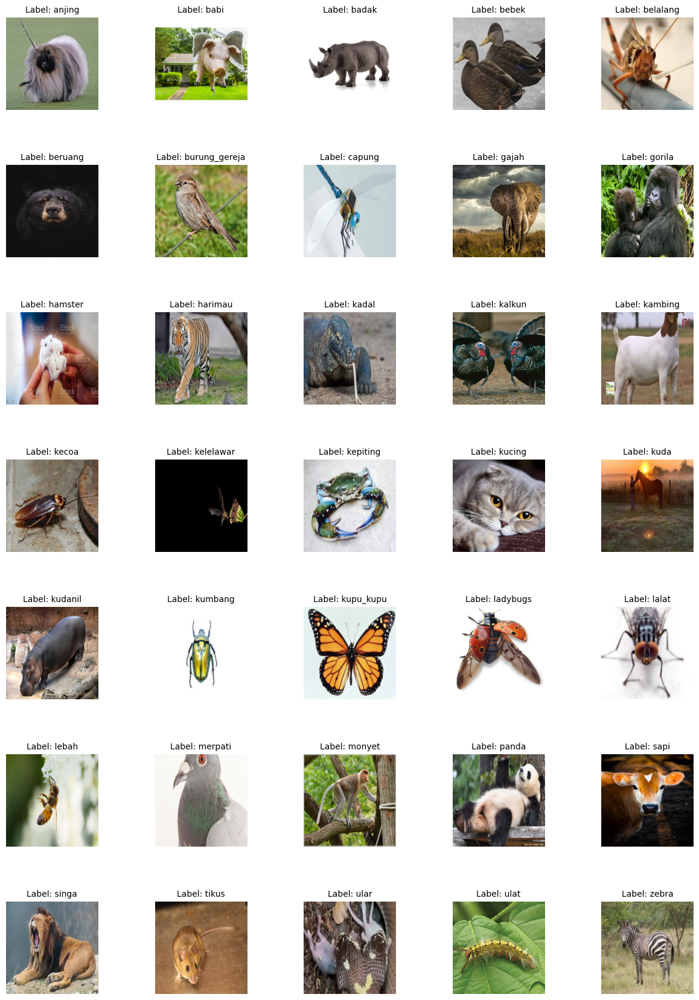

In [ ]:
def display_sample_images_per_class(data_path, label_names):
    # Tentukan jumlah kolom dan baris
    num_cols = 5
    num_rows = (len(label_names) + num_cols - 1) // num_cols
    num_animal = 20
    # Buat figure dengan ukuran dinamis
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))
    axes = axes.flatten()

    for i, animal in enumerate(sorted(label_names)):
        ax = axes[i]
        animal_path = os.path.join(data_path, animal)

        if os.path.isdir(animal_path) and (images := sorted(os.listdir(animal_path))):
            # Ambil gambar pertama dari direktori
            image_path = os.path.join(animal_path, images[num_animal])
            image = preprocess_image(image_path)
            ax.imshow(image)
            ax.set_title(f"Label: {animal}", fontsize=10)
        else:
            ax.axis('off')  # Kosongkan subplot jika tidak ada gambar

        ax.axis('off')

    # Nonaktifkan subplot kosong (sisa di luar loop)
    for ax in axes[len(label_names):]:
        ax.axis('off')

    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    plt.show()

# Contoh penggunaan
display_sample_images_per_class(data_path, animal_names)


## Encoding Label

In [ ]:
# Mengubah label menjadi angka
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(label)

# Membagi dataset menjadi training dan testing set dengan stratifikasi label
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42, shuffle=True, stratify=labels)

print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")


X_train shape: (8592, 224, 224, 3)
y_train shape: (8592,)
X_test shape: (2148, 224, 224, 3)
y_test shape: (2148,)


## Tampilkan Sample Data dan Label setelah Encoding

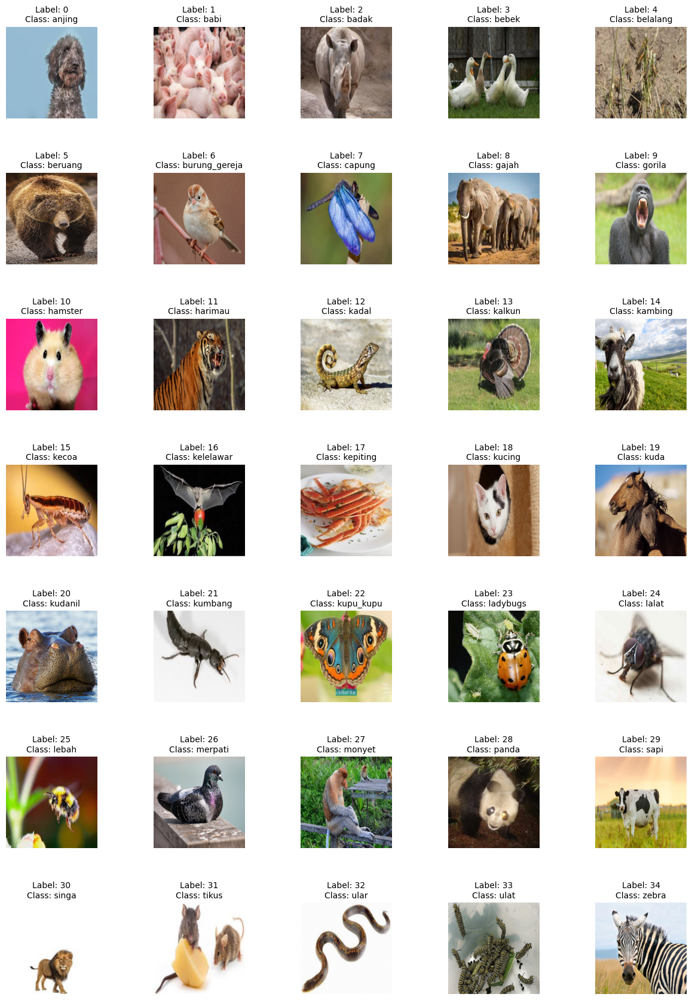

In [ ]:
# Visualisasi untuk Memeriksa Data dan Label Setelah Label Encoding
def display_encoded_sample_images(data, labels, label_encoder, num_cols=5):
    unique_labels = np.unique(labels)
    num_rows = (len(unique_labels) + num_cols - 1) // num_cols  # Menghitung jumlah baris

    plt.figure(figsize=(num_cols * 3, num_rows * 3))  # Menyesuaikan ukuran figure
    for i, label in enumerate(unique_labels):
        idx = np.where(labels == label)[0][0]  # Ambil indeks dari label yang sesuai
        image = data[idx]
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image)
        plt.title(f"Label: {label}\nClass: {label_encoder.inverse_transform([label])[0]}", fontsize=10)
        plt.axis('off')

    # Menambahkan ruang antara subplot untuk memastikan gambar lebih besar dan lebih mudah dilihat
    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    plt.show()

# Tampilkan contoh gambar dari setiap kelas setelah encoding
display_encoded_sample_images(data, labels, label_encoder)


## Buat Fungsi Untuk Melihat History Training

In [ ]:
# Fungsi untuk plot sejarah pelatihan model
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 4))

    # Plot Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'r-', label='Training Accuracy')  # garis merah untuk training accuracy
    plt.plot(epochs, val_acc, 'b-', label='Validation Accuracy')  # garis biru untuk validation accuracy
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)  # Menambahkan grid

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'r-', label='Training Loss')  # garis merah untuk training loss
    plt.plot(epochs, val_loss, 'b-', label='Validation Loss')  # garis biru untuk validation loss
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)  # Menambahkan grid

    plt.tight_layout()
    plt.show()


## Buat Early Stopping

In [ ]:
# Menggunakan early stopping untuk menghindari overfitting
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)


## MobilenetV2 untuk Base Model

In [ ]:
# Fungsi untuk memuat model pretrained MobileNetV2
from tensorflow.keras.applications import MobileNetV2

def pretrained_model_MobileNetV2():
    pretrained_model = MobileNetV2(
        include_top=False,  # Tidak menyertakan top layer (fully connected layer)
        input_shape=(224, 224, 3),
        weights='imagenet'  # Menggunakan bobot yang telah dilatih pada dataset ImageNet
    )

    # Membekukan semua layer dalam model pretrained
    for layer in pretrained_model.layers:
        layer.trainable = False

    return pretrained_model


## Buat Final Model

In [ ]:
# Fungsi untuk membuat model akhir dengan menambahkan layer pada pretrained model menggunakan Sequential API
def create_final_model(base_model, num_classes):
    model = tf.keras.Sequential()

    # Menambahkan pretrained model
    model.add(base_model)

    # Mengganti Flatten dengan GlobalAveragePooling2D untuk mengurangi jumlah parameter
    model.add(tf.keras.layers.GlobalAveragePooling2D())

    # Menambahkan Dense layer dengan Batch Normalization dan Dropout
    model.add(tf.keras.layers.Dense(1024, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.1))

    model.add(tf.keras.layers.Dense(512, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.1))

    # Output layer dengan Softmax untuk klasifikasi
    model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))

    # Kompilasi model dengan optimizer, loss, dan metrics
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


## Data Augmentation

In [ ]:
# Menggunakan ImageDataGenerator untuk augmentasi data
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

## Load Final Model and Training

9406464/9406464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              1311744   
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 1024)              0   

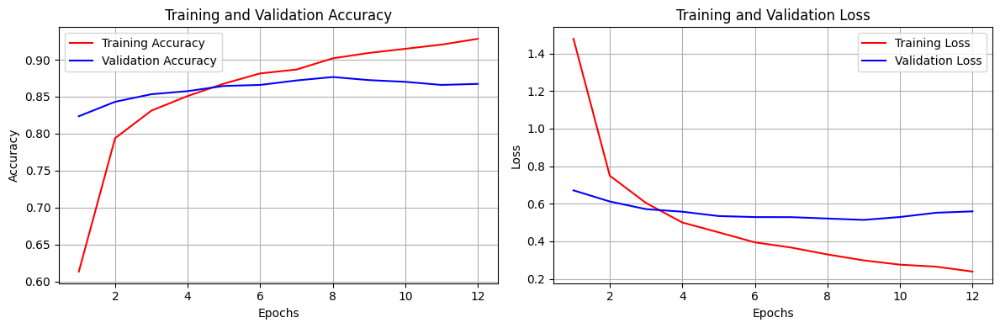

In [ ]:
# Memuat model pretrained MobileNetV2
base_model = pretrained_model_MobileNetV2()

# Membuat model akhir
model = create_final_model(base_model, len(label_encoder.classes_))

# Fit data train ke dalam generator
datagen.fit(X_train)

# Melihat ringkasan model
model.summary()

# Melatih model dengan data augmentasi
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=16),  # Menggunakan data augmentasi
    epochs=20,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],  # Menggunakan early stopping
    shuffle=True  # Mengacak data setiap epoch
)

# Plot sejarah pelatihan
plot_training_history(history)


68/68 [==============================] - 105s 2s/step


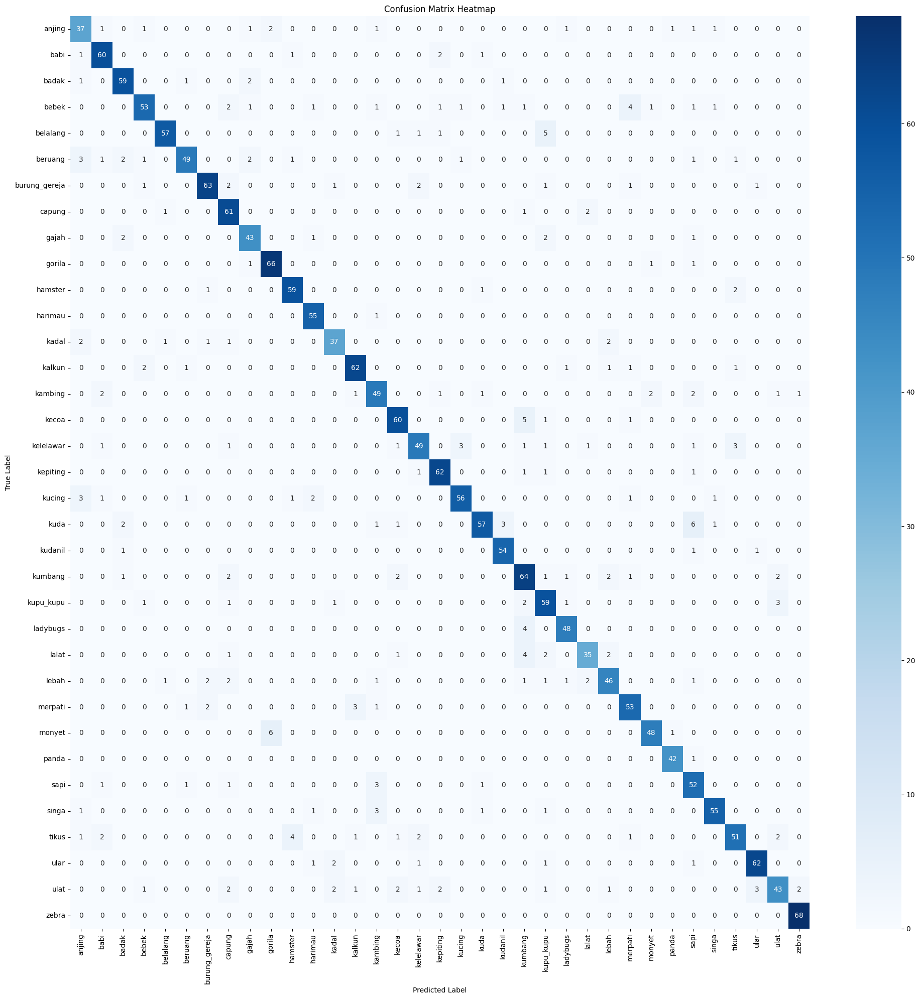

               precision    recall  f1-score   support

       anjing       0.76      0.79      0.77        47
         babi       0.87      0.92      0.90        65
        badak       0.88      0.92      0.90        64
        bebek       0.88      0.77      0.82        69
     belalang       0.95      0.88      0.91        65
      beruang       0.91      0.79      0.84        62
burung_gereja       0.91      0.88      0.89        72
       capung       0.80      0.94      0.87        65
        gajah       0.86      0.88      0.87        49
       gorila       0.89      0.96      0.92        69
      hamster       0.89      0.94      0.91        63
      harimau       0.90      0.98      0.94        56
        kadal       0.86      0.84      0.85        44
       kalkun       0.91      0.90      0.91        69
      kambing       0.80      0.82      0.81        60
        kecoa       0.87      0.90      0.88        67
    kelelawar       0.86      0.79      0.82        62
     kepi

In [ ]:
# Membuat prediksi pada data uji
y_pred = model.predict(X_test)

# Mengambil kelas dengan probabilitas tertinggi
y_pred_classes = np.argmax(y_pred, axis=1)

# Menghitung Confusion Matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Menampilkan Confusion Matrix sebagai heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix Heatmap')
plt.tight_layout()
plt.show()

In [ ]:

# Menghitung dan menampilkan classification report
report = classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_)
print(report)


               precision    recall  f1-score   support

       anjing       0.76      0.79      0.77        47
         babi       0.87      0.92      0.90        65
        badak       0.88      0.92      0.90        64
        bebek       0.88      0.77      0.82        69
     belalang       0.95      0.88      0.91        65
      beruang       0.91      0.79      0.84        62
burung_gereja       0.91      0.88      0.89        72
       capung       0.80      0.94      0.87        65
        gajah       0.86      0.88      0.87        49
       gorila       0.89      0.96      0.92        69
      hamster       0.89      0.94      0.91        63
      harimau       0.90      0.98      0.94        56
        kadal       0.86      0.84      0.85        44
       kalkun       0.91      0.90      0.91        69
      kambing       0.80      0.82      0.81        60
        kecoa       0.87      0.90      0.88        67
    kelelawar       0.86      0.79      0.82        62
     kepi

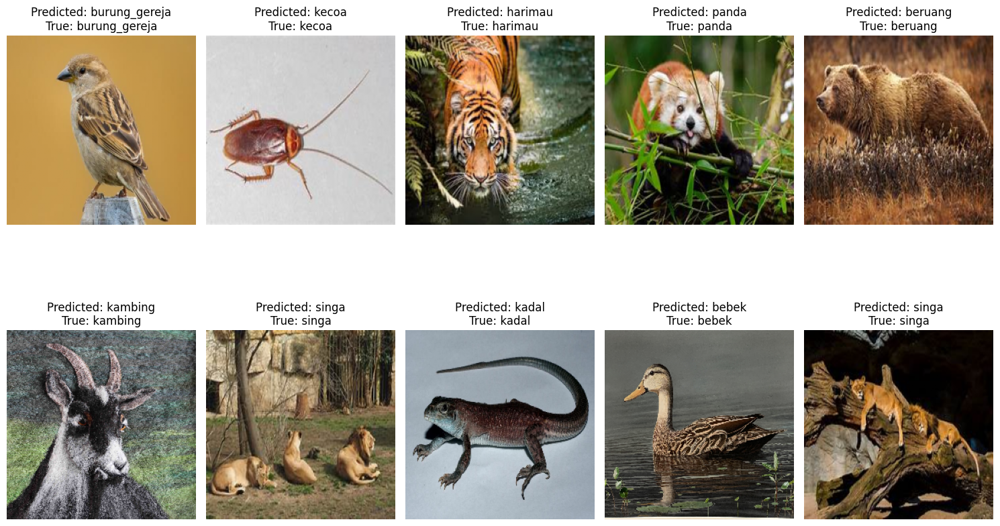

In [ ]:
# Menemukan indeks dari prediksi yang benar
correct_indices = np.where(y_test == y_pred_classes)[0]

# Memilih 10 indeks acak dari prediksi yang benar
selected_indices = np.random.choice(correct_indices, size=10, replace=False)

# Menampilkan gambar dan label yang diprediksi dengan benar
plt.figure(figsize=(15, 10))
for i, index in enumerate(selected_indices):
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test[index])
    plt.title(f"Predicted: {animal_names[y_pred_classes[index]]}\nTrue: {animal_names[y_test[index]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()


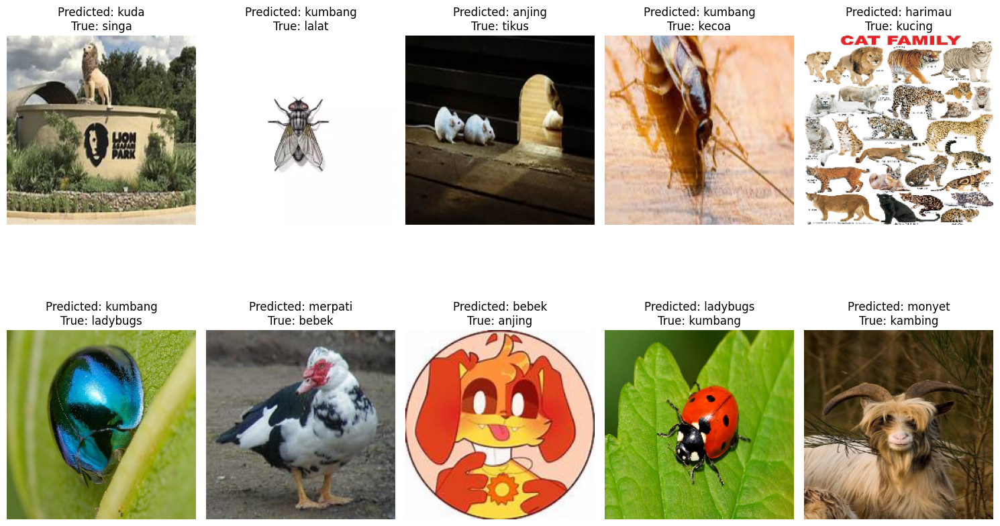

In [ ]:
# Menemukan indeks dari prediksi yang salah
incorrect_indices = np.where(y_test != y_pred_classes)[0]

# Memilih 10 indeks acak dari prediksi yang salah
selected_incorrect_indices = np.random.choice(incorrect_indices, size=10, replace=False)

# Menampilkan gambar dan label yang diprediksi salah
plt.figure(figsize=(15, 10))
for i, index in enumerate(selected_incorrect_indices):
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test[index])
    plt.title(f"Predicted: {animal_names[y_pred_classes[index]]}\nTrue: {animal_names[y_test[index]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()


Jumlah prediksi yang meleset di setiap kelas:
beruang: 13
merpati: 7
ulat: 18
lebah: 12
kelelawar: 13
bebek: 16
capung: 4
badak: 5
gajah: 6
burung_gereja: 9
kumbang: 12
lalat: 10
kuda: 14
kadal: 7
anjing: 10
kucing: 10
kambing: 11
kupu_kupu: 9
tikus: 14
kalkun: 7
hamster: 4
sapi: 7
belalang: 8
kudanil: 3
panda: 1
monyet: 7
ladybugs: 4
ular: 6
singa: 7
harimau: 1
kecoa: 7
kepiting: 4
babi: 5
gorila: 3

Total prediksi yang salah: 274


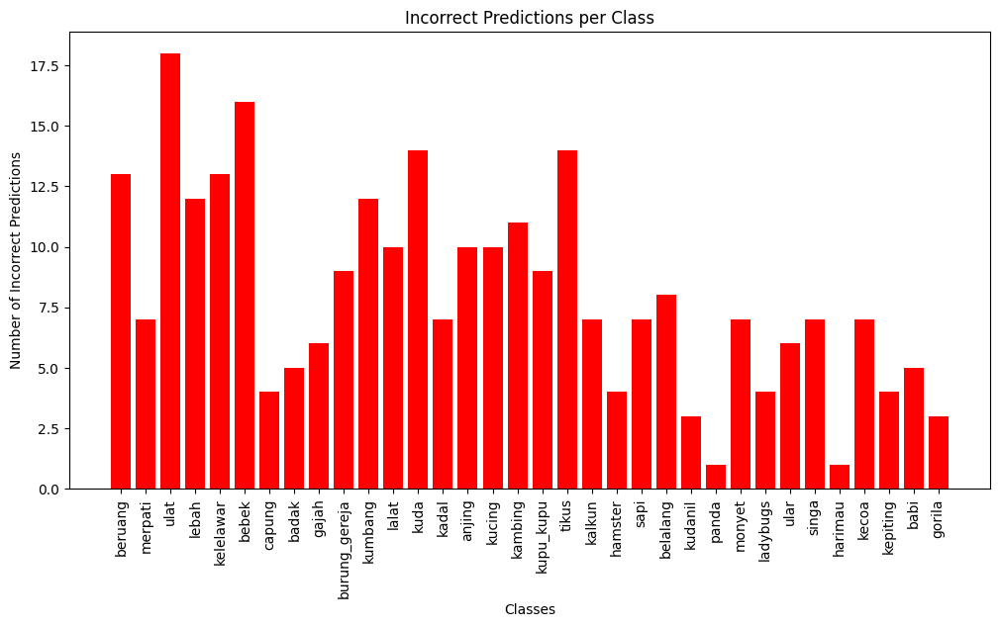

In [ ]:
# Menghitung jumlah prediksi yang salah di setiap kelas
from collections import Counter

# Mengambil nama kelas berdasarkan indeks label
class_labels = label_encoder.classes_

# Inisialisasi counter untuk menghitung kesalahan prediksi
incorrect_count_per_class = Counter()

# Loop melalui indeks yang salah dan hitung kesalahan prediksi per kelas
for index in incorrect_indices:
    true_class = y_test[index]
    predicted_class = y_pred_classes[index]
    incorrect_count_per_class[class_labels[true_class]] += 1

# Menampilkan jumlah prediksi yang meleset di setiap kelas
print("Jumlah prediksi yang meleset di setiap kelas:")
for class_name, count in incorrect_count_per_class.items():
    print(f"{class_name}: {count}")

# Menampilkan total prediksi yang salah
total_incorrect_predictions = len(incorrect_indices)
print(f"\nTotal prediksi yang salah: {total_incorrect_predictions}")

# Visualisasi jumlah prediksi yang meleset di setiap kelas
plt.figure(figsize=(12, 6))
plt.bar(incorrect_count_per_class.keys(), incorrect_count_per_class.values(), color='red')
plt.xticks(rotation=90)
plt.xlabel('Classes')
plt.ylabel('Number of Incorrect Predictions')
plt.title('Incorrect Predictions per Class')
plt.show()


Saving WhatsApp Image 2024-12-02 at 20.14.01 (3).jpeg to WhatsApp Image 2024-12-02 at 20.14.01 (3).jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.01 (2).jpeg to WhatsApp Image 2024-12-02 at 20.14.01 (2).jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.01 (1).jpeg to WhatsApp Image 2024-12-02 at 20.14.01 (1).jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.01.jpeg to WhatsApp Image 2024-12-02 at 20.14.01.jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.00 (3).jpeg to WhatsApp Image 2024-12-02 at 20.14.00 (3).jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.00 (2).jpeg to WhatsApp Image 2024-12-02 at 20.14.00 (2).jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.00 (1).jpeg to WhatsApp Image 2024-12-02 at 20.14.00 (1).jpeg
Saving WhatsApp Image 2024-12-02 at 20.14.00.jpeg to WhatsApp Image 2024-12-02 at 20.14.00.jpeg
1/1 [==============================] - 0s 50ms/step


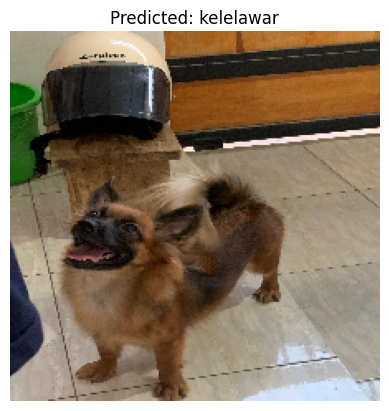

1/1 [==============================] - 0s 45ms/step


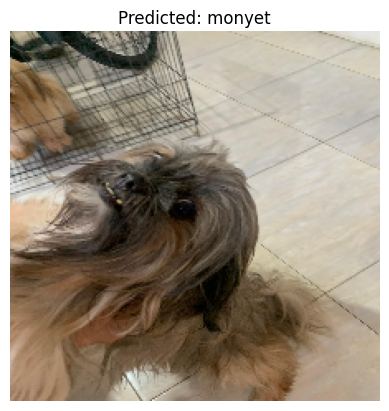

1/1 [==============================] - 0s 44ms/step


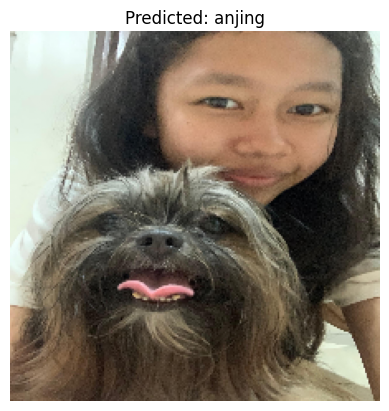

1/1 [==============================] - 0s 52ms/step


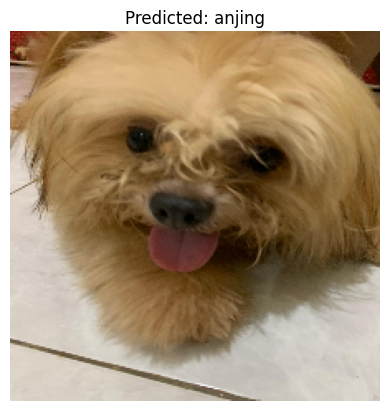

1/1 [==============================] - 0s 49ms/step


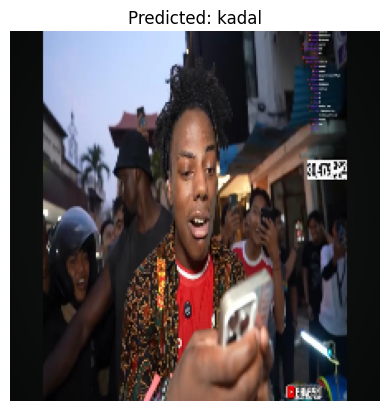

1/1 [==============================] - 0s 52ms/step


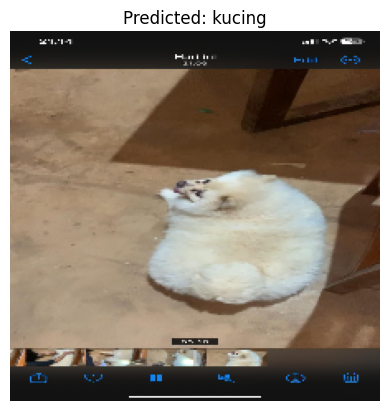

1/1 [==============================] - 0s 50ms/step


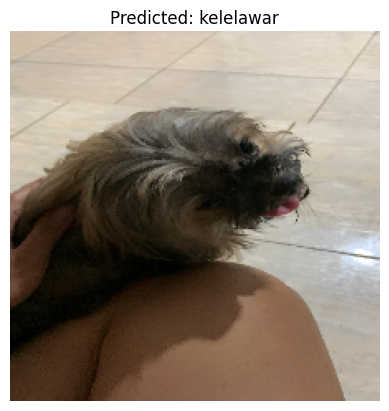

1/1 [==============================] - 0s 52ms/step


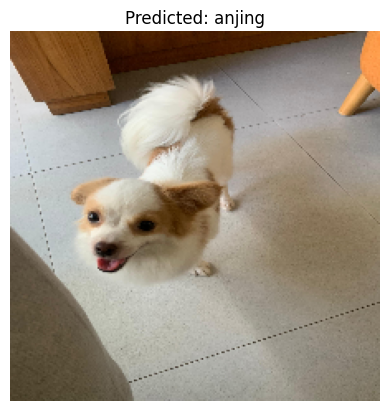

In [ ]:
from google.colab import files
# Upload a new image
uploaded = files.upload()

for fn in uploaded.keys():
  # Preprocess the uploaded image
  path = fn
  img = preprocess_image(path)
  img = np.expand_dims(img, axis=0)

  # Make prediction
  prediction = model.predict(img)
  predicted_class = np.argmax(prediction, axis=1)
  predicted_label = label_encoder.inverse_transform(predicted_class)[0]

  # Display the image and the predicted label
  plt.imshow(img[0])
  plt.title(f"Predicted: {predicted_label}")
  plt.axis('off')
  plt.show()

In [ ]:
model.save('./model_weights/AnimalPeek_Model(acc87).h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model = tf.keras.models.load_model('/content/model_weights/AnimalPeek_Model(acc87).h5')

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              1311744   
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                        

In [ ]:
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = tf_lite_converter.convert()

In [ ]:
tflite_name = 'tf_lite_model.tflite'

with open(tflite_name, 'wb') as f:
  f.write(tflite_model)